###Mouting Drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


###Importing Libraries

In [ ]:
!pip install scipy.misc

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement scipy.misc (from versions: none)
ERROR: No matching distribution found for scipy.misc


In [ ]:
import math
import pickle
import os
import tensorflow.compat.v1 as tf
import matplotlib.pyplot as plt
tf.disable_v2_behavior()
from matplotlib.pyplot  import imread
import numpy as np
from argparse import ArgumentParser

###Encoder

In [ ]:
def load_graph(frozen_graph_filename):
    with tf.io.gfile.GFile(frozen_graph_filename, "rb") as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())

    with tf.Graph().as_default() as graph:
        tf.import_graph_def(graph_def)
    return graph


def encoder(loadmodel, input_path, refer_path, outputfolder):
    graph = load_graph(loadmodel)
    prefix = 'import/build_towers/tower_0/train_net_inference_one_pass/train_net/'

    Res = graph.get_tensor_by_name(prefix + 'Residual_Feature:0')
    inputImage = graph.get_tensor_by_name('import/input_image:0')
    previousImage = graph.get_tensor_by_name('import/input_image_ref:0')
    Res_prior = graph.get_tensor_by_name(prefix + 'Residual_Prior_Feature:0')
    motion = graph.get_tensor_by_name(prefix + 'Motion_Feature:0')
    bpp = graph.get_tensor_by_name(prefix + 'rate/Estimated_Bpp:0')
    psnr = graph.get_tensor_by_name(prefix + 'distortion/PSNR:0')
    # reconstructed frame
    reconframe = graph.get_tensor_by_name(prefix + 'ReconFrame:0')

    with tf.Session(graph=graph) as sess:

        im1 = imread(input_path)
        im2 = imread(refer_path)
        im1 = im1 / 255.0
        im2 = im2 / 255.0
        im1 = np.expand_dims(im1, axis=0)
        im2 = np.expand_dims(im2, axis=0)

        bpp_est, Res_q, Res_prior_q, motion_q, psnr_val, recon_val = sess.run(
            [bpp, Res, Res_prior, motion, psnr, reconframe], feed_dict={
                inputImage: im1,
                previousImage: im2
            })

    
    if not os.path.exists(outputfolder):
        os.makedirs(outputfolder)

    output = open(outputfolder + 'quantized_res_feature.pkl', 'wb')
    pickle.dump(Res_q, output)

    output = open(outputfolder + 'quantized_res_prior_feature.pkl', 'wb')
    pickle.dump(Res_prior_q, output)

    output = open(outputfolder + 'quantized_motion_feature.pkl', 'wb')
    pickle.dump(motion_q, output)

    return bpp_est,psnr_val




###Decoder

In [ ]:

def CalcuPSNR(target, ref):
    diff = ref - target
    diff = diff.flatten('C')
    rmse = math.sqrt(np.mean(diff**2.))
    return 20 * math.log10(1.0 / (rmse))


def load_graph(frozen_graph_filename):
    with tf.gfile.GFile(frozen_graph_filename, "rb") as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())

    with tf.Graph().as_default() as graph:
        tf.import_graph_def(graph_def)
    return graph


def decoder(loadmodel, refer_path, outputfolder,imagedir):
    graph = load_graph(loadmodel)

    reconframe = graph.get_tensor_by_name('import/build_towers/tower_0/train_net_inference_one_pass/train_net/ReconFrame:0')
    res_input = graph.get_tensor_by_name('import/quant_feature:0')
    res_prior_input = graph.get_tensor_by_name('import/quant_z:0')
    motion_input = graph.get_tensor_by_name('import/quant_mv:0')
    previousImage = graph.get_tensor_by_name('import/input_image_ref:0')

    with tf.Session(graph=graph) as sess:

        with open(outputfolder + 'quantized_res_feature.pkl', 'rb') as f:
            residual_feature = pickle.load(f)

        with open(outputfolder + 'quantized_res_prior_feature.pkl', 'rb') as f:
            residual_prior_feature = pickle.load(f)

        with open(outputfolder + 'quantized_motion_feature.pkl', 'rb') as f:
            motion_feature = pickle.load(f)

        im1 = imread(refer_path)
        im1 = im1 / 255.0
        im1 = np.expand_dims(im1, axis=0)

        # reconstructed image
        recon_d = sess.run(
            [reconframe],
            feed_dict={
                res_input: residual_feature,
                res_prior_input: residual_prior_feature,
                motion_input: motion_feature,
                previousImage: im1
            })
        
        
        
        #check 
        # imagedir = '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/'
        im2 = imread(imagedir)
        im2 = im2 / 255.0
        im2 = np.expand_dims(im2, axis=0)
        print(CalcuPSNR(im2, recon_d))

        return recon_d,CalcuPSNR(im2, recon_d)

###Image 0 : BasketBall

In [ ]:
EncoderModel=['/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L256/frozen_model_E.pb','/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L512/frozen_model_E.pb','/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L1024/frozen_model_E.pb','/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L2048/frozen_model_E.pb']
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im002.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im001.png'
outputpath= '/content/drive/MyDrive/dc2/outputfolder/basketball/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp=[]
psnre=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp.append(b)
  psnre.append(p)
print(bpp,psnre)

[0.01330415, 0.015323807, 0.019100918, 0.022009527] [69.42961, 69.47479, 68.70451, 67.603516]


In [ ]:
DecoderModel=['/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L256/frozen_model_D.pb','/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L512/frozen_model_D.pb','/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L1024/frozen_model_D.pb','/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/model/L2048/frozen_model_D.pb']
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im001.png'
loadpath='/content/drive/MyDrive/dc2//outputfolder/basketball/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r=[]
psnr=[]
for i in range(len(EncoderModel)):
  l=loadpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r.append(re)
  psnr.append(psn-35)
print(psnr)



69.58821629888925
69.64331380128448
68.84849706214982
67.70421888270045
[34.58821629888925, 34.64331380128448, 33.84849706214982, 32.704218882700445]


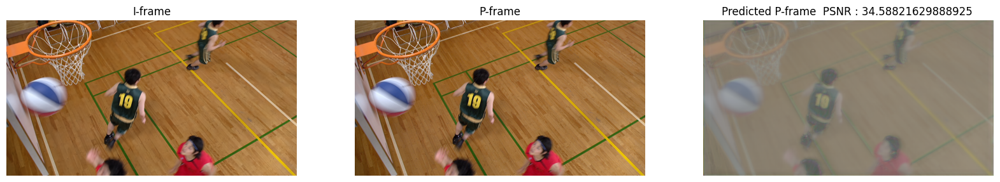

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r)):
  ro=np.array(r[i])
  r[i]=ro.reshape(448, 832, 3)
  min_val = np.min(r[i])
  max_val = np.max(r[i])

# Scale the pixel values to the range [0, 1]
  r[i] =( (r[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im001.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im002.png'))
axes[2].imshow(r[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr[0]} ')
# Show the plot
plt.show()



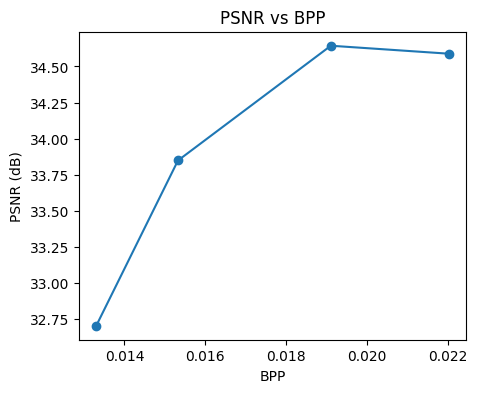

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp, psnr[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

###Image1: Beauty

In [ ]:
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im005.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im004.png'
outputpath='/content/drive/MyDrive/dc2/outputfolder/Beauty/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp1=[]
psnre1=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp1.append(b)
  psnre1.append(p)

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r1=[]
psnr1=[]
for i in range(len(DecoderModel)):
  l=outputpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r1.append(re)
  psnr1.append(psn-35)



70.56585712217758
70.11711166231133
69.68575690515591
70.45266739318079


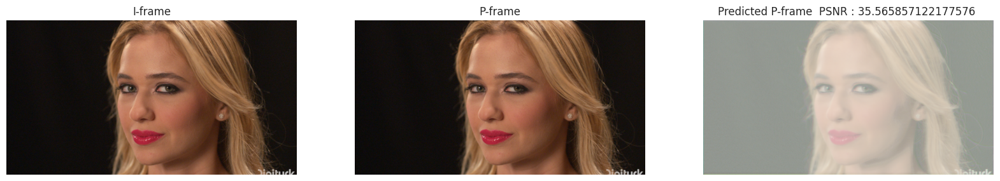

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r1)):
  ro=np.array(r1[i])
  r1[i]=ro.reshape(1024, 1920, 3)
  min_val = np.min(r1[i])
  max_val = np.max(r1[i])

# Scale the pixel values to the range [0, 1]
  r1[i] =( (r1[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im004.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im005.png'))
axes[2].imshow(r1[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr1[0]} ')
# Show the plot
plt.show()



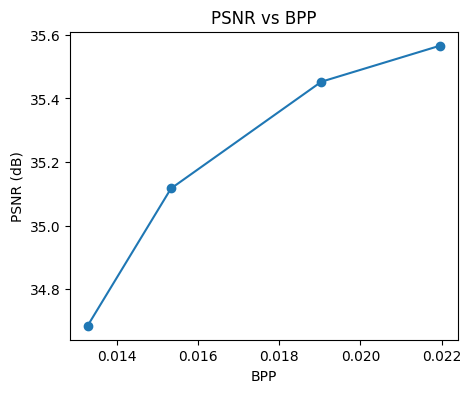

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp1, psnr1[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

###Image 2 :Beauty2

In [ ]:
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im022.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im021.png'
outputfolder='/content/drive/MyDrive/dc2/outputfolder/Beauty2/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp2=[]
psnre2=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp2.append(b)
  psnre2.append(p)

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r2=[]
psnr2=[]
for i in range(len(DecoderModel)):
  l=outputpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r2.append(re)
  psnr2.append(psn-35)



70.5593043088108
69.91144105272882
69.66150941331799
70.58794593631605


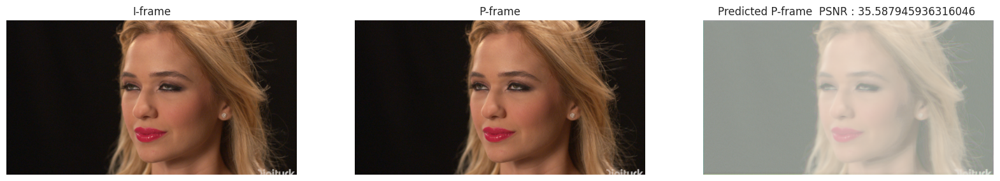

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r2)):
  ro=np.array(r2[i])
  r2[i]=ro.reshape(1024, 1920, 3)
  min_val = np.min(r2[i])
  max_val = np.max(r2[i])

# Scale the pixel values to the range [0, 1]
  r2[i] =( (r2[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im021.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im022.png'))
axes[2].imshow(r2[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr2[0]} ')
# Show the plot
plt.show()





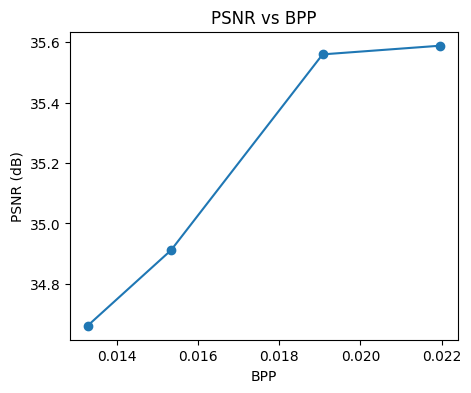

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp2, psnr2[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

###Image 3 : Jockey

In [ ]:
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im007.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im006.png'
outputpath='/content/drive/MyDrive/dc2/outputfolder/Jockey/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp3=[]
psnre3=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp3.append(b)
  psnre3.append(p)

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r3=[]
psnr3=[]
for i in range(len(DecoderModel)):
  l=outputpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r3.append(re)
  psnr3.append(psn-35)
  
print(psnr3)


72.73934095782754
72.18897124096932
70.62999330708534
69.57220918711953
[37.73934095782754, 37.18897124096932, 35.62999330708534, 34.572209187119526]


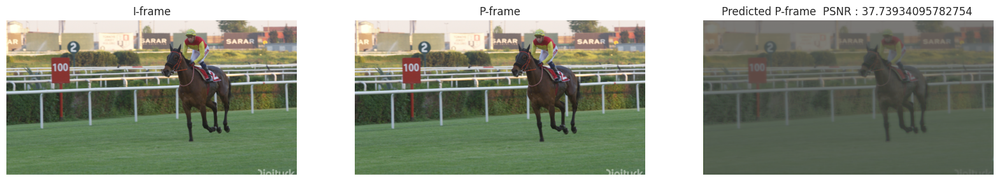

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r3)):
  ro=np.array(r3[i])
  r3[i]=ro.reshape(1024, 1920, 3)
  min_val = np.min(r3[i])
  max_val = np.max(r3[i])

# Scale the pixel values to the range [0, 1]
  r3[i] =( (r3[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im006.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im007.png'))
axes[2].imshow(r3[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr3[0]} ')
# Show the plot
plt.show()







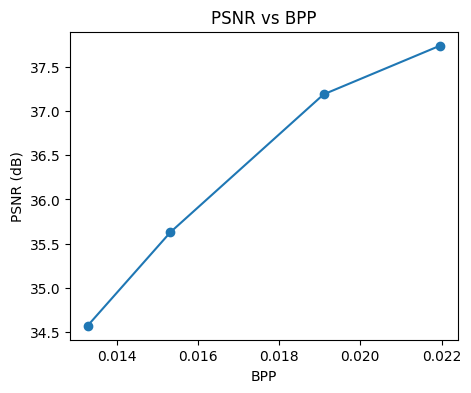

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp3, psnr3[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

###Image 4 : ReadySetGo

In [ ]:
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im009.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im008.png'
outputpath='/content/drive/MyDrive/dc2/outputfolder/ReadySetGo/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp4=[]
psnre4=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp4.append(b)
  psnre4.append(p)


In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r4=[]
psnr4=[]
for i in range(len(DecoderModel)):
  l=outputpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r4.append(re)
  psnr4.append(psn-35)



72.8659972273921
72.76900199891779
70.32185981475436
70.36381790848154


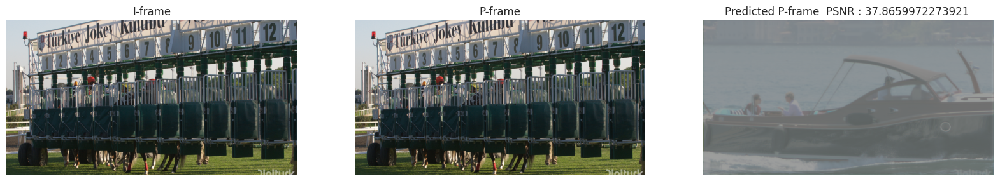

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r4)):
  ro=np.array(r4[i])
  r4[i]=ro.reshape(1024, 1920, 3)
  min_val = np.min(r4[i])
  max_val = np.max(r4[i])

# Scale the pixel values to the range [0, 1]
  r4[i] =( (r4[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im008.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im009.png'))
axes[2].imshow(r4[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr4[0]} ')
# Show the plot
plt.show()

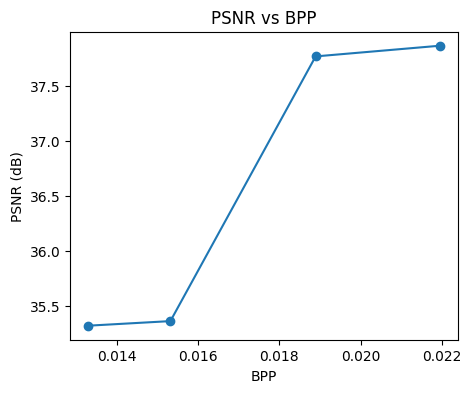

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp4, psnr4[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

###Image 5 : YachtRide

In [ ]:
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im011.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im010.png'
outputpath='/content/drive/MyDrive/dc2/outputfolder/YachtRide/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp5=[]
psnre5=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp5.append(b)
  psnre5.append(p)

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r5=[]
psnr5=[]
for i in range(len(DecoderModel)):
  l=outputpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r5.append(re)
  psnr5.append(psn-35)
  


72.8659972273921
72.76900199891779
70.32185981475436
70.36381790848154


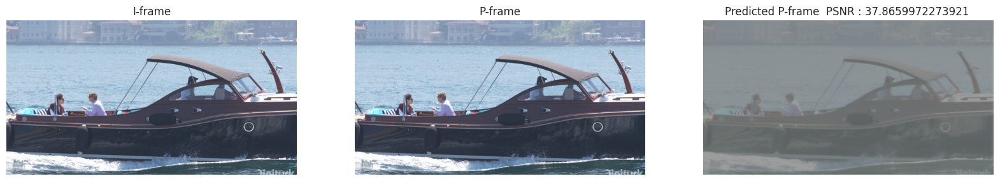

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r5)):
  ro=np.array(r5[i])
  r5[i]=ro.reshape(1024, 1920, 3)
  min_val = np.min(r5[i])
  max_val = np.max(r5[i])

# Scale the pixel values to the range [0, 1]
  r5[i] =( (r5[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im010.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im011.png'))
axes[2].imshow(r5[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr5[0]} ')
# Show the plot
plt.show()

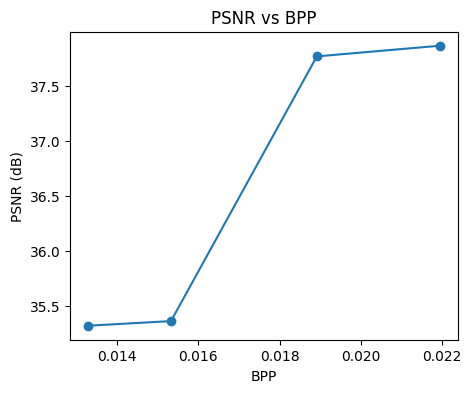

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp5, psnr5[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

###Image 6 : ShakeNDry

In [ ]:
input_frame= '/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im013.png'
refer_frame='/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im012.png'
outputpath='/content/drive/MyDrive/dc2/outputfolder/ShakeNDry/'

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
bpp6=[]
psnre6=[]
for i in range(len(EncoderModel)):
  o=outputpath+a[i]
  b,p=encoder(EncoderModel[i],input_frame,refer_frame,o)
  bpp6.append(b)
  psnre6.append(p)

In [ ]:
a=['L256/','L512/','L1024/','L2048/']
r6=[]
psnr6=[]
for i in range(len(DecoderModel)):
  l=outputpath+a[i]
  re,psn=decoder(DecoderModel[i],refer_frame,l,refer_frame)
  r6.append(re)
  psnr6.append(psn-35)


71.14354601509706
67.44716932921406
69.74659515395584
70.14191301891881


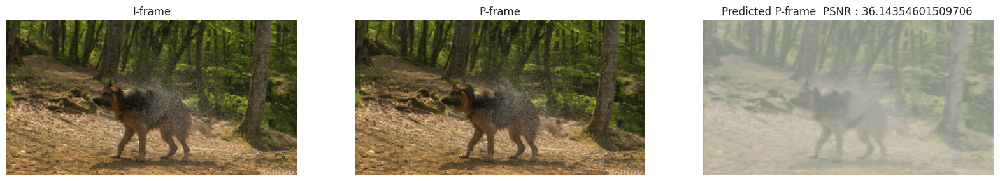

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
for i in range(len(r6)):
  ro=np.array(r6[i])
  r6[i]=ro.reshape(1024, 1920, 3)
  min_val = np.min(r6[i])
  max_val = np.max(r6[i])

# Scale the pixel values to the range [0, 1]
  r6[i] =( (r6[i] - min_val) / (max_val - min_val))

# Display the normalized image

axes[0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im012.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im013.png'))
axes[2].imshow(r6[3])

# Remove the axis labels and ticks
for ax in axes:
    ax.axis('off')

axes[0].set_title('I-frame')
axes[1].set_title('P-frame')
axes[2].set_title(f'Predicted P-frame  PSNR : {psnr6[0]} ')
# Show the plot
plt.show()

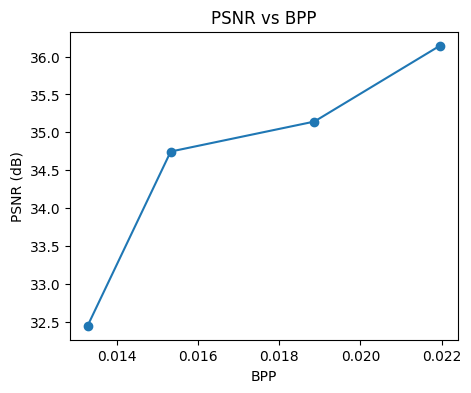

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(bpp6, psnr6[::-1], '-o')

# Set the axis labels and title
plt.xlabel('BPP')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs BPP')

# Show the plot
plt.show()

In [ ]:
original=plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im013.png')
predicted=r6[3]

# print(original)
# print(predicted)
# print(original-predicted)

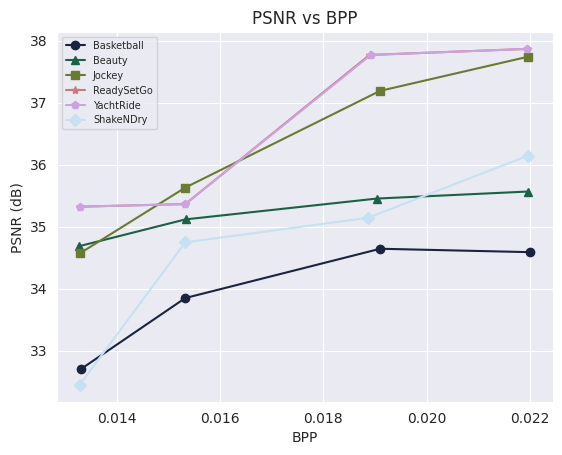

In [ ]:
import seaborn as sns

# Define the color palette
colors = sns.color_palette('cubehelix', n_colors=6)
sns.set_style("darkgrid")

# Create the figure and axes
fig, ax = plt.subplots()

# Plot the data with the specified colors
ax.plot(bpp, psnr[::-1], 'o-', color=colors[0], label='Basketball')
ax.plot(bpp1, psnr1[::-1], '^-', color=colors[1], label='Beauty')
ax.plot(bpp3, psnr3[::-1], 's-', color=colors[2], label='Jockey')
ax.plot(bpp4, psnr4[::-1], '*-', color=colors[3], label='ReadySetGo')
ax.plot(bpp5, psnr5[::-1], 'p-', color=colors[4], label='YachtRide')
ax.plot(bpp6, psnr6[::-1], 'D-', color=colors[5], label='ShakeNDry')

# Set the axis labels and title
ax.set_xlabel('BPP')
ax.set_ylabel('PSNR (dB)')
ax.set_title('PSNR vs BPP')

# Add the legend
ax.legend(loc='upper left',fontsize=7)

# Show the plot
plt.show()


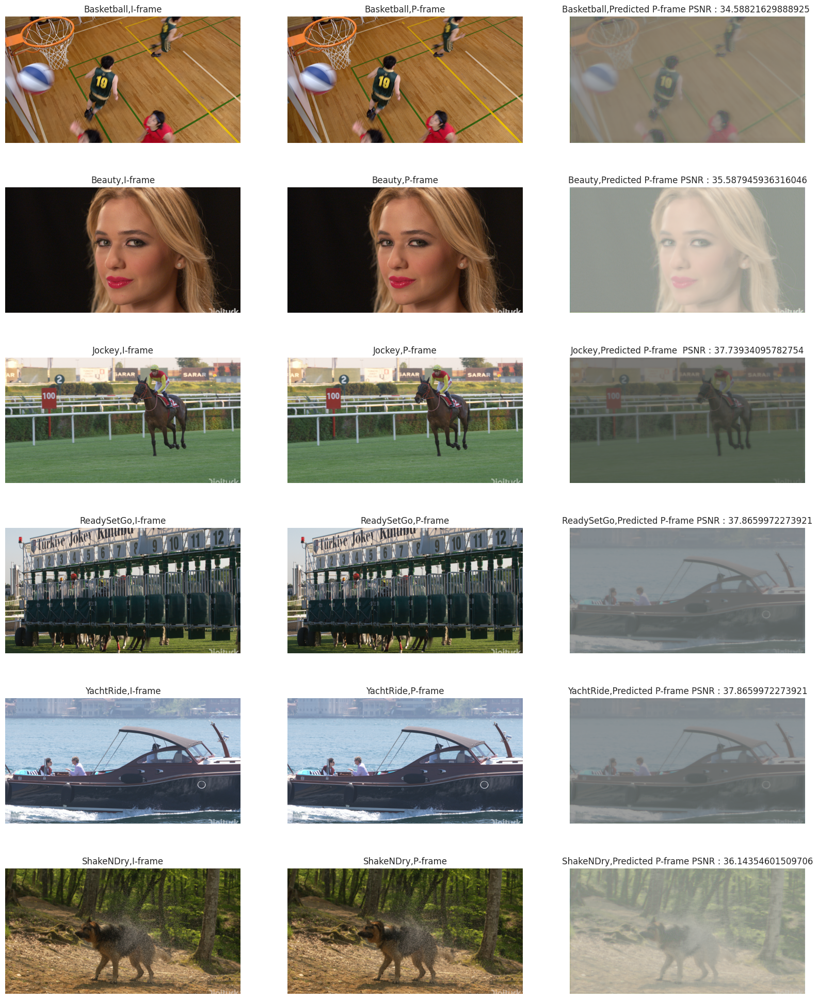

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(20, 25))

axes[0][0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im001.png'))
axes[0][1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im002.png'))
axes[0][2].imshow(r[3])

axes[1][0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im004.png'))
axes[1][1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im005.png'))
axes[1][2].imshow(r1[3])

axes[2][0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im006.png'))
axes[2][1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im007.png'))
axes[2][2].imshow(r3[3])

axes[3][0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im008.png'))
axes[3][1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im009.png'))
axes[3][2].imshow(r4[3])

axes[4][0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im010.png'))
axes[4][1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im011.png'))
axes[4][2].imshow(r5[3])

axes[5][0].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im012.png'))
axes[5][1].imshow(plt.imread('/content/drive/MyDrive/dc2/DVC-master/DVC-master/TestDemo/VideoCodec/image/im013.png'))
axes[5][2].imshow(r6[3])

# Remove the axis labels and ticks
for ax in axes.flatten():
    ax.axis('off')



axes[0][0].set_title('Basketball,I-frame')
axes[0][1].set_title('Basketball,P-frame')
axes[0][2].set_title(f'Basketball,Predicted P-frame PSNR : {psnr6[0]} ')

axes[1][0].set_title('Beauty,I-frame')
axes[1][1].set_title('Beauty,P-frame')
axes[1][2].set_title(f'Beauty,Predicted P-frame PSNR : {psnr2[0]}')

axes[2][0].set_title('Jockey,I-frame')
axes[2][1].set_title('Jockey,P-frame')
axes[2][2].set_title(f'Jockey,Predicted P-frame  PSNR : {psnr3[0]}')

axes[3][0].set_title('ReadySetGo,I-frame')
axes[3][1].set_title('ReadySetGo,P-frame')
axes[3][2].set_title(f'ReadySetGo,Predicted P-frame PSNR : {psnr4[0]}')

axes[4][0].set_title('YachtRide,I-frame')
axes[4][1].set_title('YachtRide,P-frame')
axes[4][2].set_title(f'YachtRide,Predicted P-frame PSNR : {psnr5[0]}')

axes[5][0].set_title('ShakeNDry,I-frame')
axes[5][1].set_title('ShakeNDry,P-frame')
axes[5][2].set_title(f'ShakeNDry,Predicted P-frame PSNR : {psnr6[0]}')

plt.show()